# Importações e Bibliotecas

In [447]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [448]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [449]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [450]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [451]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 150
MAX_GENERATIONS: int = 3000
BESTS: int = 2

In [452]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [453]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
8465 products loaded.


In [454]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [455]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [456]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [457]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [458]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [459]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [460]:
c: list[int] = gerar_carrinho()
c

[78656,
 1468917,
 1572736,
 421292,
 457022,
 345289,
 1534908,
 1616691,
 433121,
 338127,
 160381,
 433160,
 435275,
 1446559,
 1616029,
 41329,
 471819,
 72602,
 1618735,
 460933,
 1618763,
 1624698,
 439344,
 333435,
 123545,
 476496,
 638498,
 55547,
 271504,
 170163,
 447003,
 1459393,
 1616689,
 1376370,
 1570317,
 343565,
 1435284,
 1546915,
 1558249,
 1569987,
 1623650,
 1495617,
 68934,
 555715,
 468932,
 1590739,
 147765,
 279510,
 473241,
 197373,
 117174,
 168465,
 167889,
 454027,
 1435089,
 788816,
 1113212,
 41871,
 93601,
 1616616,
 277908,
 1614774,
 456199,
 1598115,
 380556,
 142853,
 613974,
 183969,
 1058507,
 1376236,
 1446585,
 1121325,
 459758,
 53481,
 328426,
 186763,
 478633,
 412724,
 1607131,
 1373018,
 280706,
 87786,
 401865,
 1574786,
 441084,
 1618692,
 1452968,
 75927,
 302245,
 1578848,
 435307,
 461619,
 1378029,
 470926,
 470470,
 110488,
 179791,
 307633,
 26793,
 75218]

### Geração de População Inicial

In [461]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [462]:
p: list[list[int]] = gerar_populacao()
p

[[1614082,
  506860,
  1376175,
  450085,
  659744,
  1433063,
  71229,
  99738,
  411865,
  1617743,
  428963,
  454279,
  310906,
  1446460,
  61403,
  381810,
  469956,
  30450,
  452869,
  1618832,
  589,
  1613348,
  1128685,
  446689,
  115579,
  333195,
  1446451,
  1462254,
  1567245,
  449124,
  1614240,
  435737,
  133509,
  12114,
  1613391,
  527994,
  1055995,
  1471559,
  709899,
  400352,
  454194,
  1614864,
  665372,
  270829,
  384977,
  616127,
  475099,
  1623311,
  117236,
  165442,
  1616407,
  1547051,
  668554,
  1614938,
  168623,
  1618649,
  1625317,
  307762,
  1433071,
  468390,
  41270,
  428322,
  32084,
  164309,
  27210,
  1536336,
  433157,
  422944,
  395853,
  1538436,
  475600,
  129104,
  1618918,
  283000,
  7908,
  1628298,
  1253131,
  140993,
  180969,
  448140,
  342762,
  15095,
  1624652,
  1518906,
  1617138,
  351565,
  424300,
  754865,
  658740,
  1607299,
  85350,
  614012,
  323026,
  314196,
  12328,
  1624129,
  438485,
  103391,
  1

### Avaliação

In [463]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
    'essencial': 0.35,
    'alimentos': 0.25,
    'açougue': 0.10,
    'beleza-e-perfumaria': 0.05,
    'bebidas': 0.10,
    'bebidas-alcoolicas': 0.015,
    'bebidas-alcoolicas-': 0.015,
    'limpeza': 0.05,
    'cuidados-pessoais': 0.07
}


    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
    # nota = valor_total**2
    # nota = globals()['MAX_MONEY']
    nota = 100
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    
    
    repeticoes_categoria = sum([(1 / pesos[c]) * categorias.count(c)**2 for c in set(categorias)])

    # Atualiza a nota com base nas repetições ponderadas (quanto maior o peso, mais repetido o item)
    nota *= (1 + repeticoes_categoria / len(individuo))
    
    # Bônus
    nota/= len(set(categorias))**2
    
    return nota**2 


In [464]:
n: float = avaliar(c)
n

2.1623817272709762e+20

In [465]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [466]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{62069.197314342404: [411178,
  157568,
  245376,
  1568783,
  426752,
  364277,
  1246070,
  409362,
  691326,
  197339,
  1616776,
  338127,
  458766,
  1548572,
  90421,
  344687,
  1450020,
  448141,
  459732,
  425661,
  403529,
  412721,
  638,
  1602894,
  1618875,
  505547,
  396722,
  1385767,
  441837,
  345290,
  121142,
  77935,
  20345,
  1540186,
  461950,
  1373117,
  171628,
  334119,
  64015,
  421949,
  462954,
  341817,
  428161,
  1405466,
  164309,
  472637,
  1539153,
  1309995,
  545529,
  1571636,
  143365,
  175342,
  499770,
  1532611,
  127424,
  538522,
  380029,
  1261461,
  214405,
  1613976,
  430119,
  313256,
  464940,
  1433071,
  569727,
  1624711,
  58734,
  224086,
  1618771,
  409932,
  623678,
  568450,
  136019,
  410784,
  412869,
  87500,
  423424,
  433162,
  595336,
  421951,
  1624427,
  1618732,
  1548880,
  466749,
  1606919,
  1106357,
  641769,
  1616715,
  115182,
  293027,
  327165,
  142969,
  1551349,
  62533,
  80070,
  1387190,
  8

### Seleção

In [467]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [468]:
v1: list[list[int]] = torneio(p)
v1

[[409865,
  20437,
  465407,
  1607879,
  381477,
  386315,
  311576,
  222266,
  68286,
  1376194,
  1560018,
  336649,
  1472839,
  1253093,
  1616120,
  1551009,
  456324,
  1616028,
  430366,
  693887,
  1464644,
  416834,
  1615244,
  810746,
  1444790,
  477438,
  129104,
  477571,
  427412,
  5868,
  143103,
  247456,
  1420724,
  188813,
  33222,
  54631,
  709888,
  1617165,
  1619256,
  26466,
  1509651,
  313714,
  642611,
  401844,
  384959,
  1468878,
  444706,
  1614263,
  796083,
  320945,
  471867,
  1607227,
  1059414,
  129479,
  132817,
  1607129,
  1614971,
  1551448,
  98014,
  62408,
  452630,
  1074958,
  419541,
  105098,
  705583,
  137622,
  444042,
  1433030,
  47315,
  1568064,
  60560,
  311575,
  1614274,
  135310,
  429275,
  1624155,
  23925,
  472666,
  411865,
  1373110,
  357266,
  660197,
  1616342,
  1609340,
  1075799,
  1616632,
  593936,
  430264,
  1618980,
  1616550,
  1609409,
  1341702,
  1619122,
  411985,
  1386624,
  682262,
  115258,
  15

In [469]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [470]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[458758,
  324851,
  286048,
  1616778,
  1623190,
  807870,
  476495,
  335049,
  52721,
  421776,
  90775,
  1623360,
  512748,
  1567004,
  1616615,
  312887,
  89337,
  1616728,
  13424,
  1539001,
  382463,
  1617164,
  478637,
  444469,
  216122,
  1446562,
  167889,
  332802,
  1566072,
  2706,
  332048,
  276660,
  480616,
  1568091,
  1616604,
  181282,
  304821,
  324850,
  1614055,
  429235,
  361293,
  1619426,
  384526,
  334208,
  1496553,
  361325,
  1468914,
  181919,
  305398,
  410781,
  116915,
  1616043,
  403497,
  1568237,
  175870,
  81744,
  464456,
  467538,
  467539,
  696307,
  430630,
  447228,
  392614,
  343639,
  493233,
  111375,
  1615279,
  1609409,
  1242784,
  478311,
  330493,
  544116,
  578533,
  1623181,
  310568,
  810654,
  102545,
  105475,
  1450013,
  423311,
  1545245,
  1628298,
  418803,
  4528,
  1614227,
  1378061,
  311637,
  1600783,
  441606,
  1551446,
  405456,
  99738,
  469957,
  1613319,
  325085,
  343565,
  420367,
  292183,


In [471]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [472]:
e: list[list[int]] = eugenia(p)
e

[[411178,
  157568,
  245376,
  1568783,
  426752,
  364277,
  1246070,
  409362,
  691326,
  197339,
  1616776,
  338127,
  458766,
  1548572,
  90421,
  344687,
  1450020,
  448141,
  459732,
  425661,
  403529,
  412721,
  638,
  1602894,
  1618875,
  505547,
  396722,
  1385767,
  441837,
  345290,
  121142,
  77935,
  20345,
  1540186,
  461950,
  1373117,
  171628,
  334119,
  64015,
  421949,
  462954,
  341817,
  428161,
  1405466,
  164309,
  472637,
  1539153,
  1309995,
  545529,
  1571636,
  143365,
  175342,
  499770,
  1532611,
  127424,
  538522,
  380029,
  1261461,
  214405,
  1613976,
  430119,
  313256,
  464940,
  1433071,
  569727,
  1624711,
  58734,
  224086,
  1618771,
  409932,
  623678,
  568450,
  136019,
  410784,
  412869,
  87500,
  423424,
  433162,
  595336,
  421951,
  1624427,
  1618732,
  1548880,
  466749,
  1606919,
  1106357,
  641769,
  1616715,
  115182,
  293027,
  327165,
  142969,
  1551349,
  62533,
  80070,
  1387190,
  83091,
  56768,
  471

### Crossover e Mutação

In [473]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [474]:
f: list[list[int]] = cruzamento(v1)
f

[[409865,
  20437,
  465407,
  1607879,
  381477,
  386315,
  311576,
  222266,
  68286,
  1376194,
  1560018,
  336649,
  1472839,
  1253093,
  28056,
  16941,
  433121,
  1307781,
  326560,
  3893,
  411238,
  1440347,
  30521,
  446693,
  416186,
  197300,
  181551,
  190423,
  169387,
  685061,
  1450034,
  124121,
  110223,
  1592485,
  468357,
  74215,
  423170,
  1617165,
  1619256,
  26466,
  1509651,
  313714,
  642611,
  401844,
  384959,
  1468878,
  444706,
  1614263,
  796083,
  320945,
  471867,
  1607227,
  1059414,
  653517,
  342435,
  140607,
  696307,
  1615391,
  364303,
  1387091,
  319450,
  117174,
  433099,
  622944,
  381476,
  1466954,
  685065,
  1609275,
  463525,
  331288,
  479197,
  46274,
  461329,
  1609410,
  1065155,
  796070,
  435291,
  290985,
  399216,
  1609252,
  60924,
  1614163,
  132839,
  426888,
  754854,
  459661,
  1057832,
  197222,
  697132,
  1449980,
  1616742,
  238360,
  1590732,
  356782,
  77519,
  168948,
  409405,
  345483,
  17

In [475]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [476]:
mt: list[list[Produto]] = mutar(f)
mt

[[409865,
  20437,
  465407,
  1607879,
  381477,
  386315,
  311576,
  222266,
  68286,
  1376194,
  1560018,
  336649,
  1472839,
  1253093,
  28056,
  16941,
  433121,
  1307781,
  326560,
  3893,
  411238,
  1440347,
  30521,
  446693,
  17135,
  197300,
  181551,
  190423,
  169387,
  685061,
  1450034,
  124121,
  110223,
  1592485,
  468357,
  74215,
  423170,
  1617165,
  1619256,
  26466,
  1509651,
  313714,
  642611,
  1371144,
  1477070,
  1468878,
  444706,
  1614263,
  796083,
  320945,
  471867,
  1607227,
  1059414,
  653517,
  342435,
  140607,
  696307,
  1615391,
  364303,
  1387091,
  319450,
  117174,
  433099,
  622944,
  381476,
  1466954,
  685065,
  1609275,
  463525,
  331288,
  479197,
  46274,
  461329,
  1609410,
  1065155,
  796070,
  435291,
  290985,
  399216,
  1609252,
  60924,
  1614163,
  132839,
  426888,
  754854,
  459661,
  1057832,
  197222,
  697132,
  1449980,
  1616742,
  238360,
  1590732,
  356782,
  77519,
  168948,
  409405,
  345483,
  1

# Execução Principal

In [477]:
relatorio: dict[dict[str: float]] = {}

In [478]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [479]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 9.22273066937351e+24, 'min': 103295.28168402777, 'med': 103800867480.94122}
Geração: 2 - {'max': 1.9776739724588883e+22, 'min': 61811.430839002256, 'med': 39562309759.459435}
Geração: 3 - {'max': 6.835842733518936e+20, 'min': 61811.430839002256, 'med': 17555381725.672348}
Geração: 4 - {'max': 2.1164353605704547e+22, 'min': 61811.430839002256, 'med': 10389605060.460896}
Geração: 5 - {'max': 12408335065811.62, 'min': 46867.03174430367, 'med': 4127773028.2296133}
Geração: 6 - {'max': 2993239428208.9214, 'min': 38625.998137140334, 'med': 460056419.89855206}
Geração: 7 - {'max': 4.853955621407249e+21, 'min': 38625.998137140334, 'med': 5757178.359410431}
Geração: 8 - {'max': 1.7805611272907227e+20, 'min': 38625.998137140334, 'med': 131290.63788236384}
Geração: 9 - {'max': 1.3076325796025018e+17, 'min': 37190.24952158376, 'med': 127237.0083761396}
Geração: 10 - {'max': 2.1876455595513756e+16, 'min': 34094.83006192366, 'med': 100320.19297627905}
Geração: 11 - {'max': 4.624

In [480]:
plot_generations(relatorio)

In [481]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 864

 [INDIVÍDUO]
Nota: 15650.730749038936
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1643.58
Peso Total: 75.15g
Volume Total: 144138.76cm³
Preço médio: R$16.4358

[PRODUTOS]
Menor preço: R$2.79
Maior preço: R$63.99
Menor peso: 2.55g
Maior peso: 18000.0g
Menor volume: 85.485cm³
Maior volume: 15008.0cm³

[CATEGORIAS]:
- cuidados-pessoais: 7
- bebidas-alcoolicas: 1
- bebidas-alcoolicas-: 2
- limpeza: 5
- beleza-e-perfumaria: 5
- essencial: 35
- alimentos: 25
- açougue: 10
- bebidas: 10

[LISTAGEM]
Cerveja Corona Extra Pilsen 330ml Long Neck 	 R$6.39 	 540.00g 	 838.92cm³
Biscoito Maçã e Canela Papapá Biscotti Pacote 60g 	 R$13.79 	 72.00g 	 378.00cm³
Sabonete em Barra Hidratante Nivea Creme Care Caixa 90g 	 R$4.99 	 95.50g 	 155.49cm³
Café Torrado e Moído Bourbon Amarelo Orfeu Caixa 250g 	 R$28.99 	 287.10g 	 573.75cm³
Tempero para Carnes, Legumes e Arroz Mais Sabor MAGGI 50g 	 R$4.59 	 57.00g 	 315.00cm³
Leite Longa Vida de Cabra Integral CAPRILAT 1 Litro 	 R

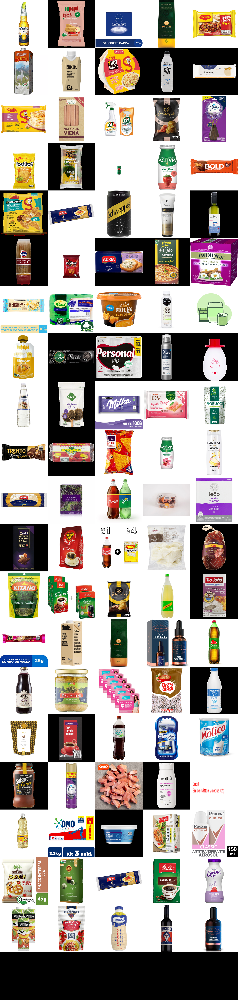

In [482]:
mosaic(best_cart)